<a href="https://colab.research.google.com/github/LucasCalbucuraZ/ARClim_db/blob/main/ARClim.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install simplekml
!pip install rasterio matplotlib cartopy

In [ ]:
def plot_present_future(lat_centro, lon_centro, season, variable):
    import matplotlib.pyplot as plt
    import rasterio
    from rasterio.plot import show
    import geopandas as gpd
    import numpy as np
    from shapely.geometry import box
    from rasterio.transform import rowcol, xy
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import requests
    import tempfile
    import os
    from matplotlib.cm import ScalarMappable
    import matplotlib.colors as mcolors

    if season.lower() not in ['summer', 'winter']:
        raise ValueError("El argumento 'season' debe ser 'summer' o 'winter'")

    # Diccionario de variables
    variable_info = {
        "mean_temperature": {
            "titulo": "Temperatura media (°C)",
            "vmin": -10, "vmax": 25, "cmap": "turbo", "unidad": "°C"
        },
        "coldest_day": {
            "titulo": "Día más frío (°C)",
            "vmin": -15, "vmax": 20, "cmap": "turbo", "unidad": "°C"
        },
        "coldest_night": {
            "titulo": "Noche más fría (°C)",
            "vmin": -15, "vmax": 20, "cmap": "turbo", "unidad": "°C"
        },
        "hottest_day": {
            "titulo": "Día más cálido (°C)",
            "vmin": 0, "vmax": 30, "cmap": "turbo", "unidad": "°C"
        },
        "warmest_night": {
            "titulo": "Noche más cálida (°C)",
            "vmin": 0, "vmax": 25, "cmap": "turbo", "unidad": "°C"
        },
        "vel_mean": {
            "titulo": "Velocidad del viento media (m/s)",
            "vmin": 0, "vmax": 20, "cmap": "turbo", "unidad": "m/s"
        },
        "vel_max": {
            "titulo": "Velocidad del viento máxima (m/s)",
            "vmin": 0, "vmax": 20, "cmap": "turbo", "unidad": "m/s"
        },
        "pr_sum": {
            "titulo": "Precipitación acumulada (mm)",
            "vmin": 0, "vmax": 100, "cmap": "Blues", "unidad": "mm"
        },
        "ps_mean": {
            "titulo": "Presión atmosférica media (mbar)",
            "vmin": 400, "vmax": 1013, "cmap": "turbo", "unidad": "mbar"
        },
        "hurs_mean": {
            "titulo": "Humedad relativa media (%)",
            "vmin": 0, "vmax": 100, "cmap": "turbo", "unidad": "%", "porcentaje": True
        }

    }


    if variable not in variable_info:
        raise ValueError(f"La variable '{variable}' no está definida.")

    info = variable_info[variable]

    # === Descarga de archivos tiff desde repositorio GitHub ===
    def load_tiff_from_github(url):
        response = requests.get(url)
        if response.status_code != 200:
            raise Exception(f"Error al descargar archivo: {url}")
        temp_file = tempfile.NamedTemporaryFile(delete=False, suffix=".tif")
        temp_file.write(response.content)
        temp_file.close()
        return temp_file.name

    # === Bounding box ===
    buffer_lat_norte = 1.0
    buffer_lat_sur = 1.35
    buffer_lon_este = 0.7
    buffer_lon_oeste = 2.3

    lat_min = lat_centro - buffer_lat_sur
    lat_max = lat_centro + buffer_lat_norte
    lon_min = lon_centro - buffer_lon_oeste
    lon_max = lon_centro + buffer_lon_este
    bbox = box(lon_min, lat_min, lon_max, lat_max)

    # === URLs desde GitHub ===
    url_base = f"https://raw.githubusercontent.com/LucasCalbucuraZ/ARClim_db/main/{season}/{variable}/"
    tiff_paths = {
        "Presente (1980–2010)": url_base + f"{variable}_present_{season}_latlon.tif",
        "Futuro (2035–2065)": url_base + f"{variable}_future_{season}_latlon.tif"
    }

    def download_shapefile_from_github(name, folder):
        """Descarga los archivos de un shapefile desde GitHub."""
        base_url = "https://raw.githubusercontent.com/LucasCalbucuraZ/ARClim_db/main/SHP"
        exts = ['shp', 'shx', 'dbf', 'prj', 'CPG']

        os.makedirs(f"SHP/{folder}", exist_ok=True)

        for ext in exts:
            url = f"{base_url}/{folder}/{name}.{ext}"
            local_path = f"SHP/{folder}/{name}.{ext}"
            if not os.path.exists(local_path):
                r = requests.get(url)
                if r.status_code == 200:
                    with open(local_path, 'wb') as f:
                        f.write(r.content)
                else:
                    print(f"No se pudo descargar {url} (status {r.status_code})")

    # Descargamos y leemos shapefiles de límites comunales y regionales
    download_shapefile_from_github("Comunas", "Comunas")
    download_shapefile_from_github("Regional", "Regiones")

    gdf_comunas = gpd.read_file("SHP/Comunas/Comunas.shp").to_crs("EPSG:4326")
    gdf_regiones = gpd.read_file("SHP/Regiones/Regional.shp").to_crs("EPSG:4326")

    gdf_comunas = gdf_comunas[gdf_comunas['Region'].str.contains("Atacama", case=False, na=False) | gdf_comunas['Region'].str.contains("Antofagasta", case=False, na=False)]
    gdf_comunas = gdf_comunas[gdf_comunas.intersects(bbox)].copy()
    gdf_regiones = gdf_regiones[gdf_regiones.intersects(bbox)].copy()


    # Graficamos
    fig, axes = plt.subplots(1, 2, figsize=(20, 9), subplot_kw={'projection': ccrs.PlateCarree()})

    for ax, (title, tiff_url) in zip(axes, tiff_paths.items()):
        local_path = load_tiff_from_github(tiff_url)

        with rasterio.open(local_path) as src:
            data = src.read(1)
            transform = src.transform
            fila, columna = rowcol(transform, lon_centro, lat_centro)
            valor_en_punto = data[fila, columna] if np.isfinite(data[fila, columna]) else np.nan
            unidad = info.get("unidad", "")
            texto_valor = f'{valor_en_punto:.1f} {unidad}' if np.isfinite(valor_en_punto) else 'NaN'
            x_min, y_max = xy(transform, fila, columna, offset='ul')
            x_max, y_min = xy(transform, fila, columna, offset='lr')

            ax.add_feature(cfeature.OCEAN, facecolor='#a6cee3')
            ax.add_feature(cfeature.LAND, facecolor='#e6e1d3')
            ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
            ax.coastlines()

            img = show(data, transform=transform, ax=ax,
                       cmap=info["cmap"], vmin=info["vmin"], vmax=info["vmax"])

            gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
            gl.top_labels = False
            gl.right_labels = False
            gl.xlabel_style = {'size': 12}
            gl.ylabel_style = {'size': 12}
            unidad = info.get("unidad", "")

            ax.text(
                lon_centro - 0.4,
                lat_centro + 0.1,
                f'{abs(lat_centro):.2f}°S, {abs(lon_centro):.2f}°O\n{texto_valor}',
                fontsize=13,
                color='black',
                bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3')
            )

            for i in range(data.shape[0]):
                for j in range(data.shape[1]):
                    if i == fila and j == columna:
                        continue
                    valor = data[i, j]
                    if not np.isfinite(valor):
                        continue
                    lon_celda, lat_celda = xy(transform, i, j, offset='center')
                    if (lon_min <= lon_celda <= lon_max) and (lat_min <= lat_celda <= lat_max):
                        x0, y1 = xy(transform, i, j, offset='ul')
                        x1, y0 = xy(transform, i, j, offset='lr')
                        ax.plot([x0, x1, x1, x0, x0], [y0, y0, y1, y1, y0], color='black', linewidth=0.5)

            ax.plot([x_min, x_max, x_max, x_min, x_min],
                    [y_min, y_min, y_max, y_max, y_min], 'r-', linewidth=2)

            for geom in gdf_regiones.geometry:
                ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='none',
                                  edgecolor='black', linewidth=2, linestyle='--')
            for geom in gdf_comunas.geometry:
                ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='none',
                                  edgecolor='black', linewidth=0.5)
            for _, row in gdf_comunas.iterrows():
                centroid = row.geometry.buffer(0).intersection(bbox).centroid
                ax.text(
                    centroid.x, centroid.y, row['Comuna'],
                    fontsize=12, color='black',
                    ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', boxstyle='round',pad=0.2)
                )

            estacional = "Verano extendido (octubre–marzo)" if season == "summer" else "Invierno extendido (abril–septiembre)"
            titulo = f'{info["titulo"]} - {title}\n{estacional}'
            ax.set_title(titulo, fontsize=14)

            cbar = plt.colorbar(img.get_images()[0], ax=ax, orientation='vertical', shrink=0.655, pad=0.02)
            cbar.set_label(info["titulo"], fontsize=12)
            cbar.ax.tick_params(labelsize=11)

        os.remove(local_path)

    #plt.tight_layout()
    plt.show()


In [ ]:
def plot_delta_present_future(lat_centro, lon_centro, season, variable):
    import matplotlib.pyplot as plt
    import rasterio
    from rasterio.plot import show
    import geopandas as gpd
    import numpy as np
    from shapely.geometry import box
    from rasterio.transform import rowcol, xy
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    import requests
    import tempfile
    import os
    from matplotlib.cm import ScalarMappable
    import matplotlib.colors as mcolors

    if season.lower() not in ['summer', 'winter']:
        raise ValueError("El argumento 'season' debe ser 'summer' o 'winter'")

    # Diccionario de variables
    variable_info = {
    "mean_temperature": {
        "titulo": "Temperatura media (°C)",
        "titulo_minus": "temperatura media (°C)",
        "vmin": -5, "vmax": 5, "cmap": "RdBu_r", "unidad": "°C", "porcentaje": False
    },
    "coldest_day": {
        "titulo": "Día más frío (°C)",
        "titulo_minus": "día más frío (°C)",
        "vmin": -5, "vmax": 5, "cmap": "RdBu_r", "unidad": "°C", "porcentaje": False
    },
    "coldest_night": {
        "titulo": "Noche más fría (°C)",
        "titulo_minus": "noche más fría (°C)",
        "vmin": -5, "vmax": 5, "cmap": "RdBu_r", "unidad": "°C", "porcentaje": False
    },
    "hottest_day": {
        "titulo": "Día más cálido (°C)",
        "titulo_minus": "día más cálido (°C)",
        "vmin": -5, "vmax": 5, "cmap": "RdBu_r", "unidad": "°C", "porcentaje": False
    },
    "warmest_night": {
        "titulo": "Noche más cálida (°C)",
        "titulo_minus": "noche más cálida (°C)",
        "vmin": -5, "vmax": 5, "cmap": "RdBu_r", "unidad": "°C", "porcentaje": False
    },
    "vel_mean": {
        "titulo": "Velocidad del viento media (%)",
        "titulo_minus": "velocidad del viento media (%)",
        "vmin": -10, "vmax": 10, "cmap": "BrBG", "unidad": "%", "porcentaje": True
    },
    "vel_max": {
        "titulo": "Velocidad del viento máxima (%)",
        "titulo_minus": "velocidad del viento máxima (%)",
        "vmin": -10, "vmax": 10, "cmap": "BrBG", "unidad": "%", "porcentaje": True
    },
    "pr_sum": {
        "titulo": "Precipitación acumulada (%)",
        "titulo_minus": "precipitación acumulada (%)",
        "vmin": -10, "vmax": 10, "cmap": "BrBG", "unidad": "%", "porcentaje": True
    },
        "ps_mean": {
            "titulo": "Presión atmosférica media (mbar)",
            "titulo_minus": "presión atmosférica media (mbar)",
            "vmin": -10, "vmax": 10, "cmap": "turbo", "unidad": "mbar", "porcentaje": False
        },
        "hurs_mean": {
            "titulo": "Humedad relativa media (%)",
            "titulo_minus": "humedad relativa media (%)",
            "vmin": -10, "vmax": 10, "cmap": "turbo", "unidad": "%", "porcentaje": True
        }
}



    if variable not in variable_info:
        raise ValueError(f"La variable '{variable}' no está soportada.")

    info = variable_info[variable]

    # === Bounding box ===
    buffer_lat_norte = 1.0
    buffer_lat_sur = 1.35
    buffer_lon_este = 0.7
    buffer_lon_oeste = 2.3
    lat_min = lat_centro - buffer_lat_sur
    lat_max = lat_centro + buffer_lat_norte
    lon_min = lon_centro - buffer_lon_oeste
    lon_max = lon_centro + buffer_lon_este
    bbox = box(lon_min, lat_min, lon_max, lat_max)

    # === URLs desde GitHub ===
    base_url = f"https://raw.githubusercontent.com/LucasCalbucuraZ/ARClim_db/main/{season}/{variable}/"
    url_present = base_url + f"{variable}_present_{season}_latlon.tif"
    url_future = base_url + f"{variable}_future_{season}_latlon.tif"

    def load_tiff(url):
        r = requests.get(url)
        if r.status_code != 200:
            raise Exception(f"No se pudo descargar: {url}")
        f = tempfile.NamedTemporaryFile(delete=False, suffix=".tif")
        f.write(r.content)
        f.close()
        return f.name

    path_present = load_tiff(url_present)
    path_future = load_tiff(url_future)

    with rasterio.open(path_present) as src_p, rasterio.open(path_future) as src_f:
        data_p = src_p.read(1).astype(np.float32)
        data_f = src_f.read(1).astype(np.float32)
        data_p = np.round(data_p, 1)
        data_f = np.round(data_f, 1)
        transform = src_p.transform

        # Cálculo del delta
        if info["porcentaje"]:
            delta = np.where(np.isfinite(data_p) & (data_p != 0),
                             100 * (data_f - data_p) / data_p,
                             np.nan)
        else:
            delta = data_f - data_p

        fila, columna = rowcol(transform, lon_centro, lat_centro)
        valor_en_punto = delta[fila, columna] if np.isfinite(delta[fila, columna]) else np.nan
        valor_presente = data_p[fila, columna]
        valor_futuro = data_f[fila, columna]

        texto_valor = f'{valor_en_punto:.1f} {info["unidad"]}' if np.isfinite(valor_en_punto) else 'NaN'
        x_min, y_max = xy(transform, fila, columna, offset='ul')
        x_max, y_min = xy(transform, fila, columna, offset='lr')

    # === Shapefiles ===
    def download_shapefile_from_github(name, folder):
        """Descarga los archivos de un shapefile desde GitHub."""
        base_url = "https://raw.githubusercontent.com/LucasCalbucuraZ/ARClim_db/main/SHP"
        exts = ['shp', 'shx', 'dbf', 'prj', 'CPG']

        os.makedirs(f"SHP/{folder}", exist_ok=True)

        for ext in exts:
            url = f"{base_url}/{folder}/{name}.{ext}"
            local_path = f"SHP/{folder}/{name}.{ext}"
            if not os.path.exists(local_path):
                r = requests.get(url)
                if r.status_code == 200:
                    with open(local_path, 'wb') as f:
                        f.write(r.content)
                else:
                    print(f"No se pudo descargar {url} (status {r.status_code})")

    # Descargar si no existe
    download_shapefile_from_github("Comunas", "Comunas")
    download_shapefile_from_github("Regional", "Regiones")

    # Leer shapefiles
    gdf_comunas = gpd.read_file("SHP/Comunas/Comunas.shp").to_crs("EPSG:4326")
    gdf_regiones = gpd.read_file("SHP/Regiones/Regional.shp").to_crs("EPSG:4326")


    gdf_comunas = gdf_comunas[
        gdf_comunas['Region'].str.contains("Atacama", case=False, na=False) |
        gdf_comunas['Region'].str.contains("Antofagasta", case=False, na=False)
    ]
    gdf_comunas = gdf_comunas[gdf_comunas.intersects(bbox)].copy()
    gdf_regiones = gdf_regiones[gdf_regiones.intersects(bbox)].copy()

    # === Plot ===
    fig, ax = plt.subplots(1, 1, figsize=(8.5, 9), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.add_feature(cfeature.OCEAN, facecolor='#a6cee3')
    ax.add_feature(cfeature.LAND, facecolor='#e6e1d3')
    ax.set_extent([lon_min, lon_max, lat_min, lat_max], crs=ccrs.PlateCarree())
    ax.coastlines()

    # Mostrar con show (no devuelve imagen directamente útil para la colorbar)
    show(delta, transform=transform, ax=ax,
        cmap=info["cmap"], vmin=info["vmin"], vmax=info["vmax"])

    # Crear manualmente un ScalarMappable para la barra de color
    norm = mcolors.Normalize(vmin=info["vmin"], vmax=info["vmax"])
    sm = ScalarMappable(norm=norm, cmap=info["cmap"])
    sm.set_array([])

    cbar = plt.colorbar(sm, ax=ax, orientation='vertical', shrink=0.645, pad=0.02)
    cbar.set_label(f'Diferencia de {info["titulo"]}', fontsize=12)
    cbar.ax.tick_params(labelsize=11)

    gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 12}
    gl.ylabel_style = {'size': 12}

    ax.text(
        lon_centro - 0.4,
        lat_centro + 0.1,
        f'{abs(lat_centro):.2f}°S, {abs(lon_centro):.2f}°O\n{texto_valor}',
        fontsize=13,
        color='black',
        bbox=dict(facecolor='white', edgecolor='black', boxstyle='round',pad=0.3)
    )

    for i in range(delta.shape[0]):
        for j in range(delta.shape[1]):
            if i == fila and j == columna:
                continue
            val = delta[i, j]
            if not np.isfinite(val):
                continue
            lon_celda, lat_celda = xy(transform, i, j, offset='center')
            if (lon_min <= lon_celda <= lon_max) and (lat_min <= lat_celda <= lat_max):
                x0, y1 = xy(transform, i, j, offset='ul')
                x1, y0 = xy(transform, i, j, offset='lr')
                ax.plot([x0, x1, x1, x0, x0], [y0, y0, y1, y1, y0], color='black', linewidth=0.5)

    rect_x = [x_min, x_max, x_max, x_min, x_min]
    rect_y = [y_min, y_min, y_max, y_max, y_min]
    ax.plot(rect_x, rect_y, 'r-', linewidth=2)

    for geom in gdf_regiones.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=2, linestyle='--')
    for geom in gdf_comunas.geometry:
        ax.add_geometries([geom], crs=ccrs.PlateCarree(), facecolor='none', edgecolor='black', linewidth=0.5)
    for _, row in gdf_comunas.iterrows():
        centroid = row.geometry.buffer(0).intersection(bbox).centroid
        ax.text(
            centroid.x, centroid.y, row['Comuna'],
            fontsize=12, color='black',
            ha='center', va='center',
            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', boxstyle='round',pad=0.2)
        )

    estacional = "Verano extendido (octubre–marzo)" if season == "summer" else "Invierno extendido (abril–septiembre)"
    titulo = f'Diferencia de {info["titulo_minus"]}\n{estacional}'
    ax.set_title(titulo, fontsize=14)




    os.remove(path_present)
    os.remove(path_future)
    plt.show()

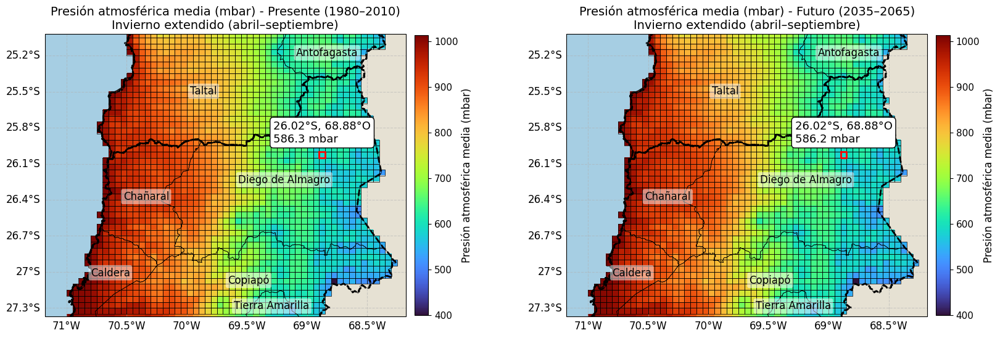

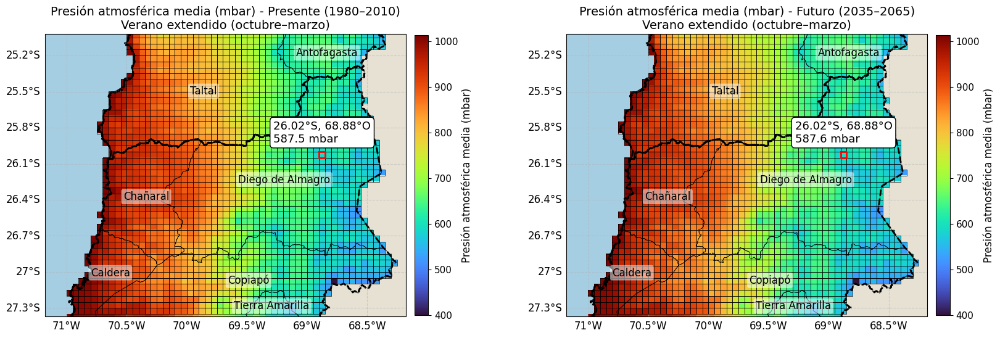

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='ps_mean')
plot_present_future(-26.02, -68.88, season='summer', variable='ps_mean')


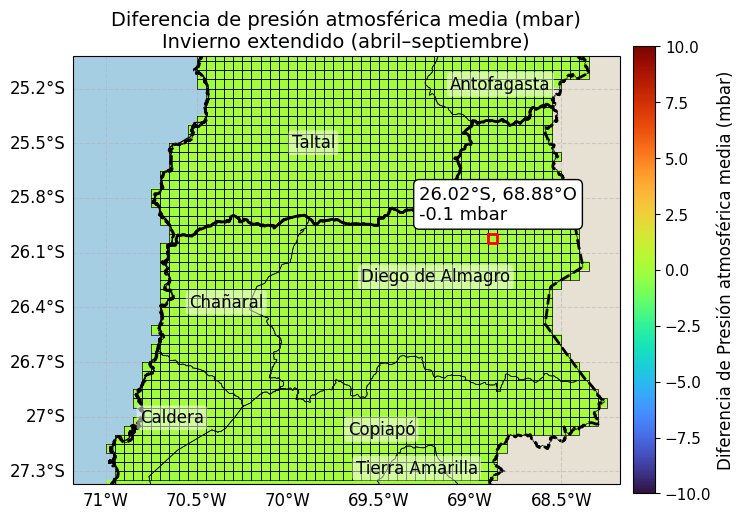

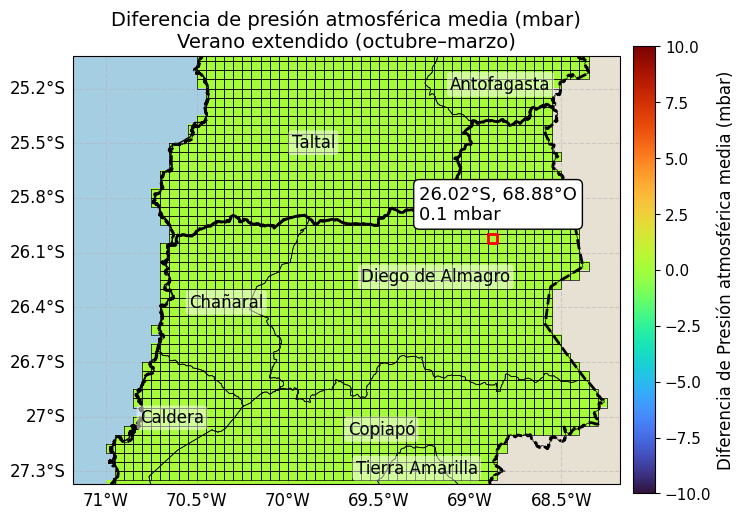

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='ps_mean')
plot_present_future(-26.02, -68.88, season='summer', variable='ps_mean')
plot_delta_present_future(-26.02, -68.88, season='winter', variable='ps_mean')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='ps_mean')


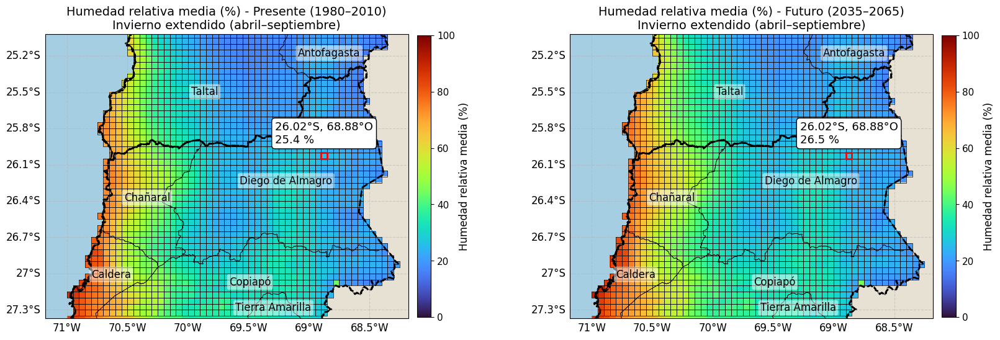

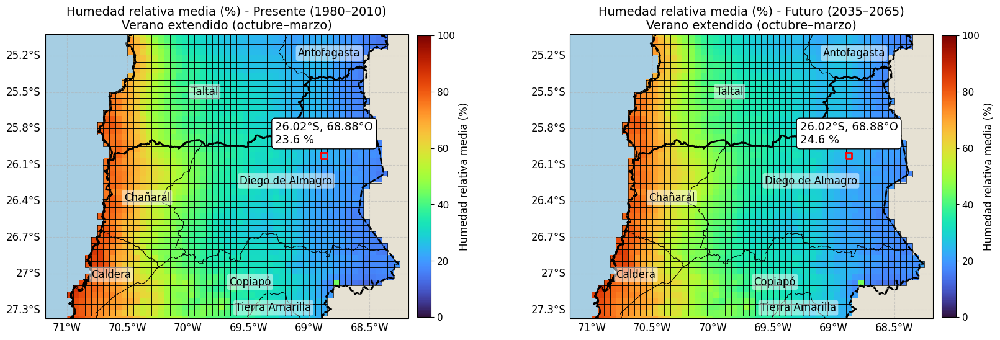

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='hurs_mean')
plot_present_future(-26.02, -68.88, season='summer', variable='hurs_mean')


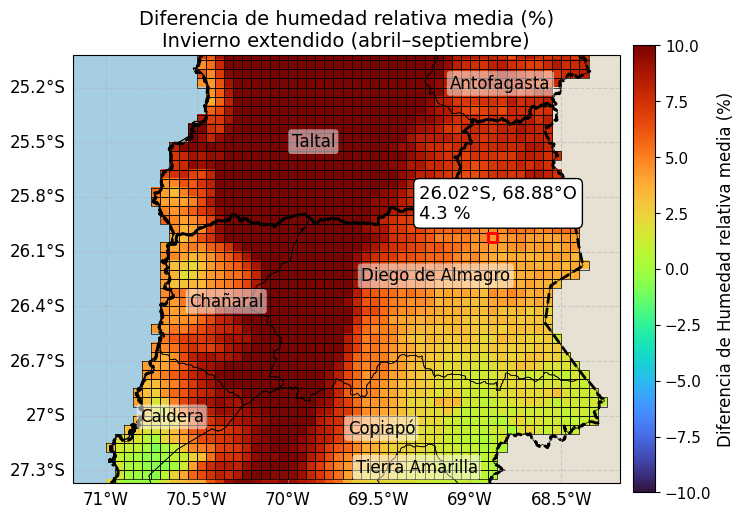

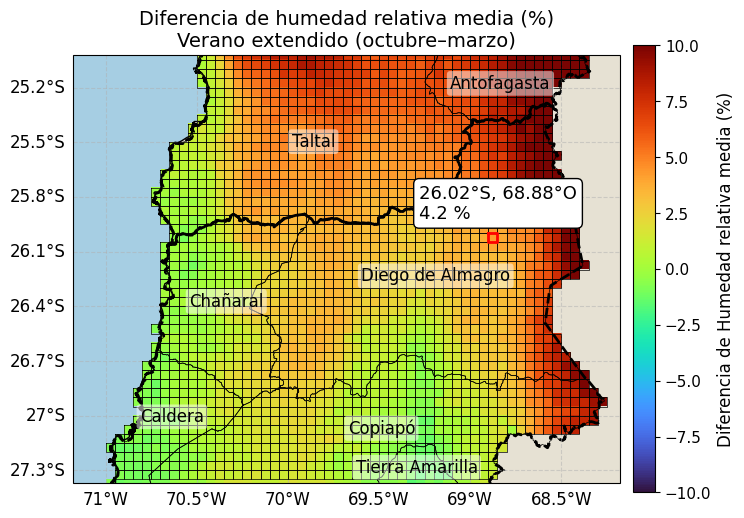

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='hurs_mean')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='hurs_mean')

/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.11/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


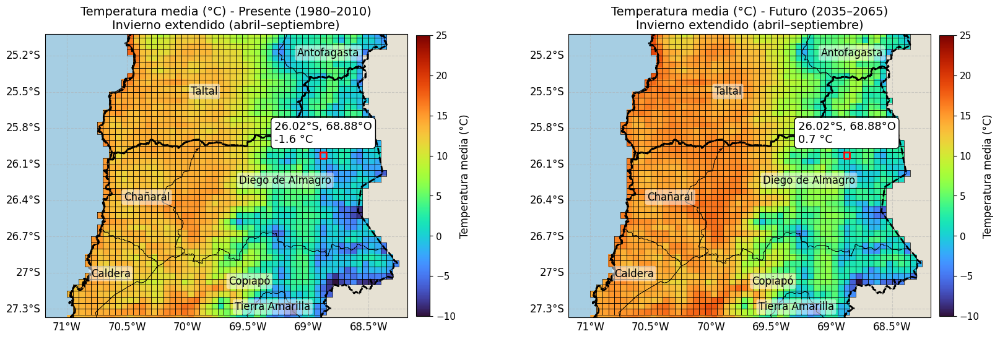

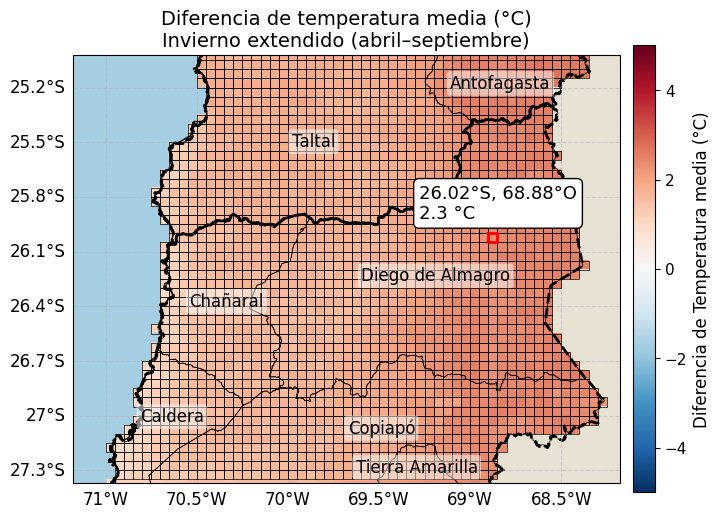

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='mean_temperature')
plot_delta_present_future(-26.02, -68.88, season='winter', variable='mean_temperature')


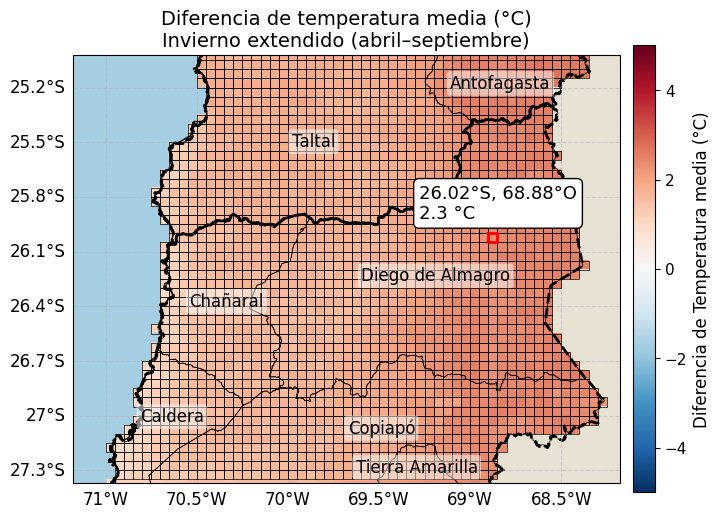

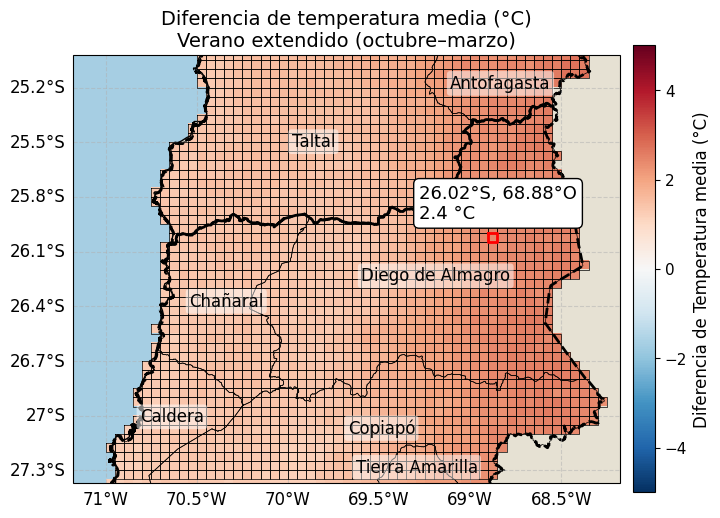

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='mean_temperature')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='mean_temperature')

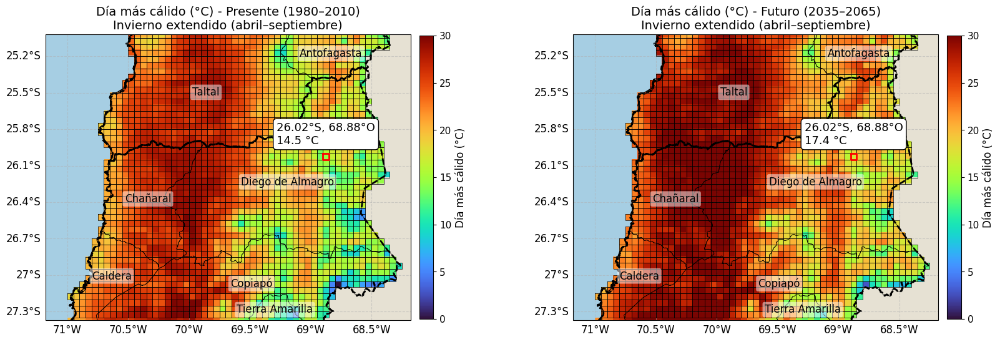

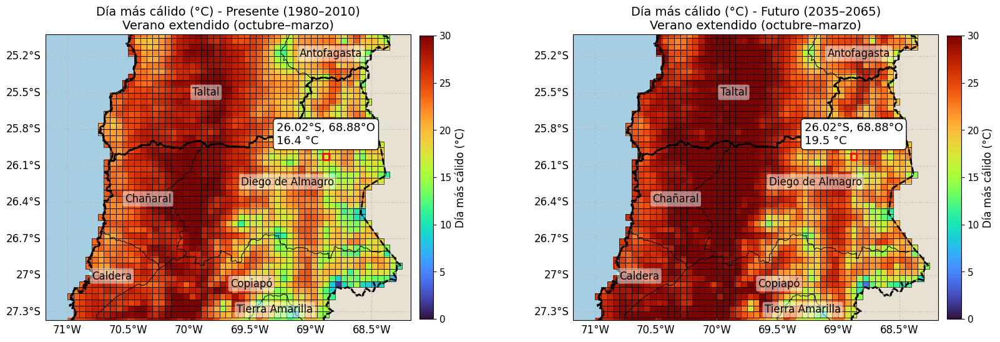

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='hottest_day')
plot_present_future(-26.02, -68.88, season='summer', variable='hottest_day')

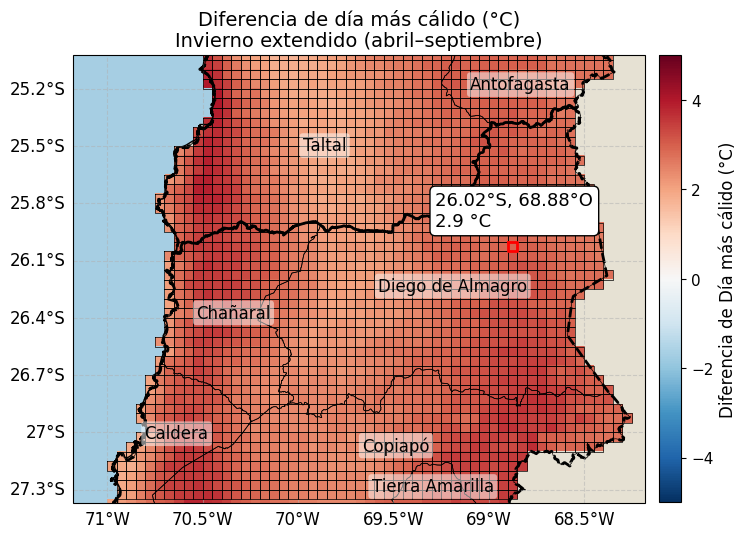

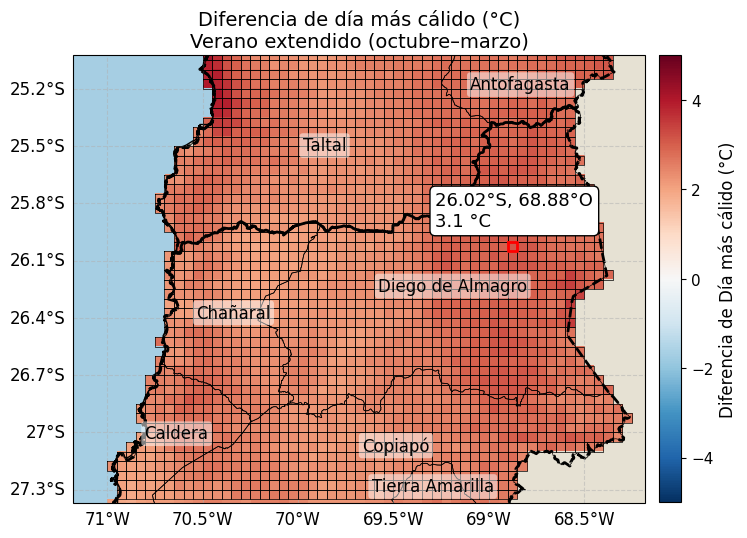

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='hottest_day')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='hottest_day')

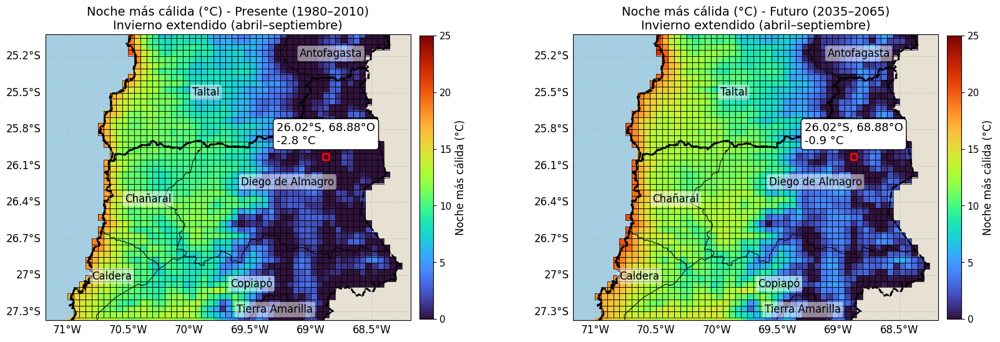

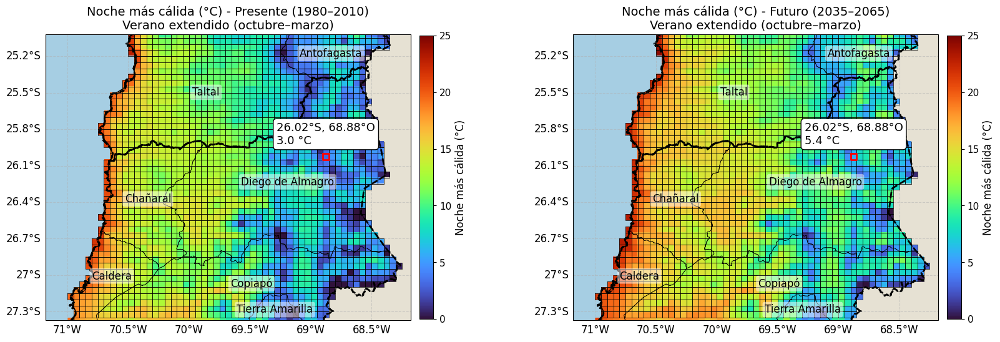

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='warmest_night')
plot_present_future(-26.02, -68.88, season='summer', variable='warmest_night')


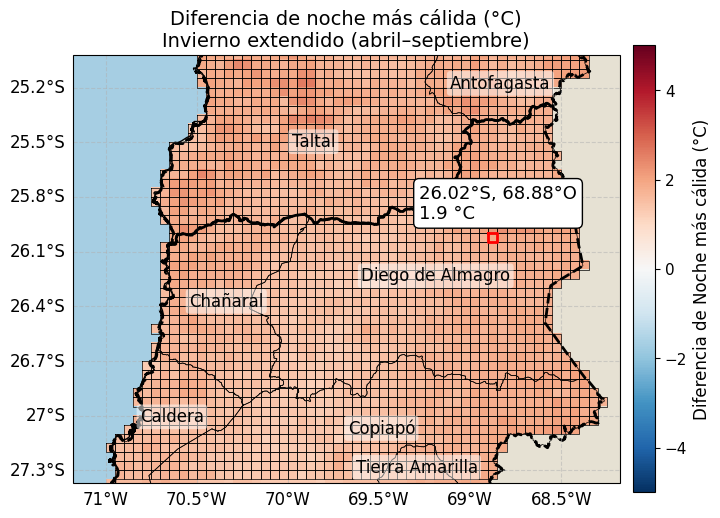

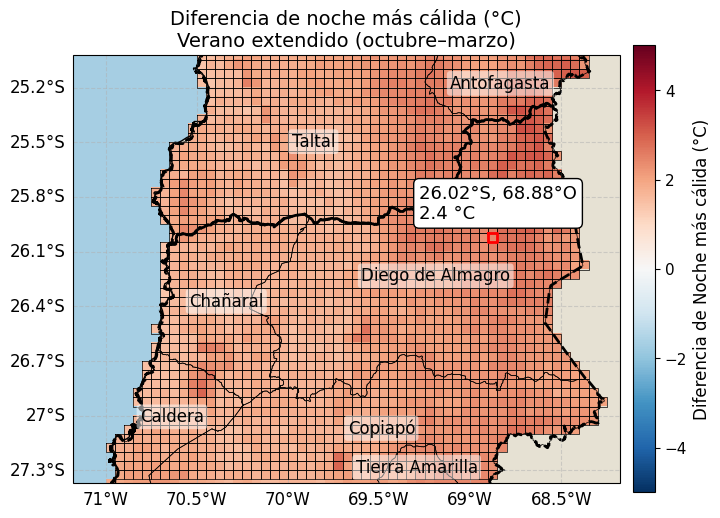

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='warmest_night')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='warmest_night')


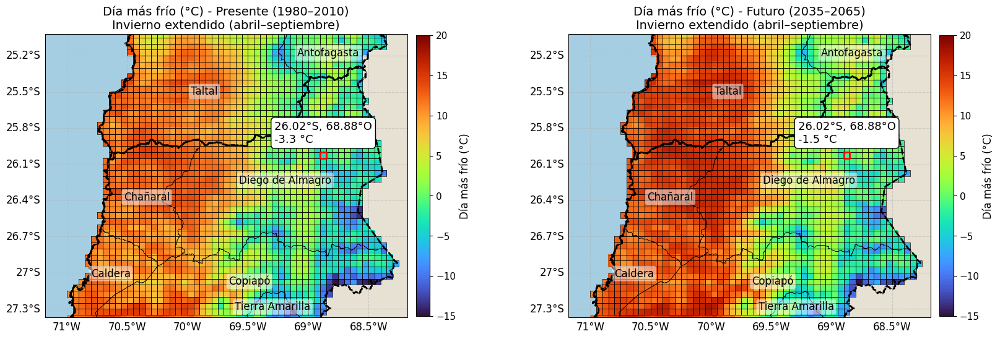

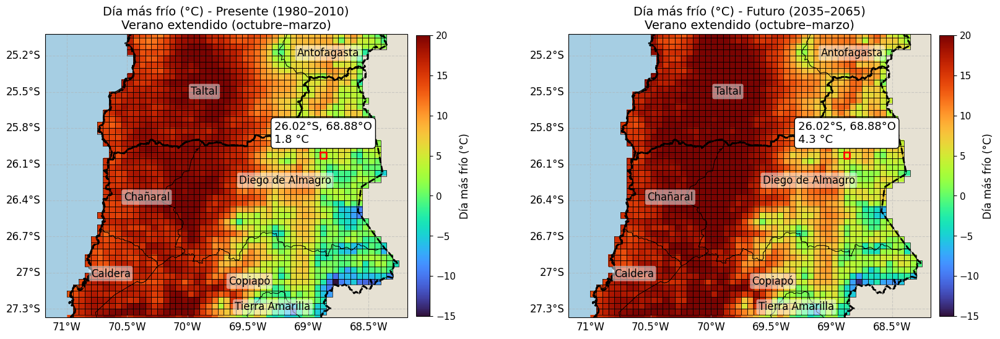

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='coldest_day')
plot_present_future(-26.02, -68.88, season='summer', variable='coldest_day')


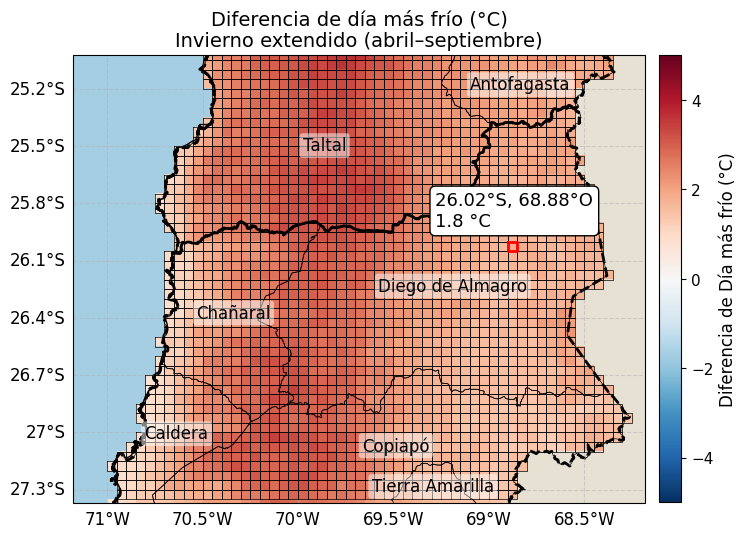

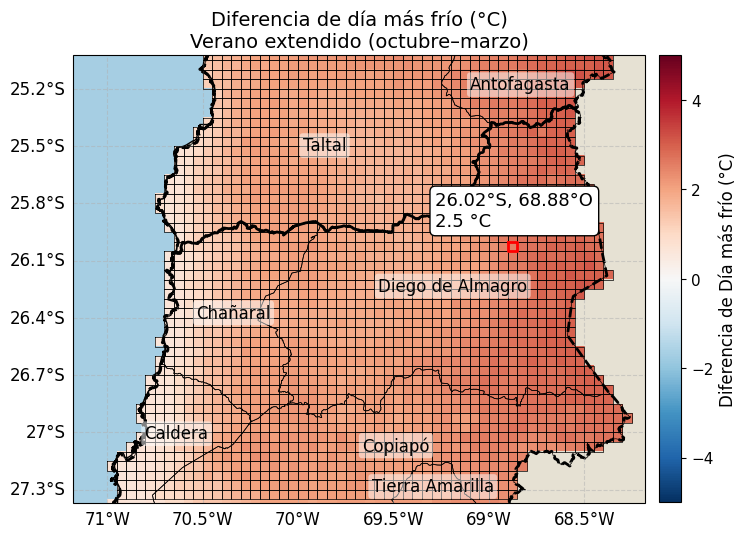

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='coldest_day')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='coldest_day')


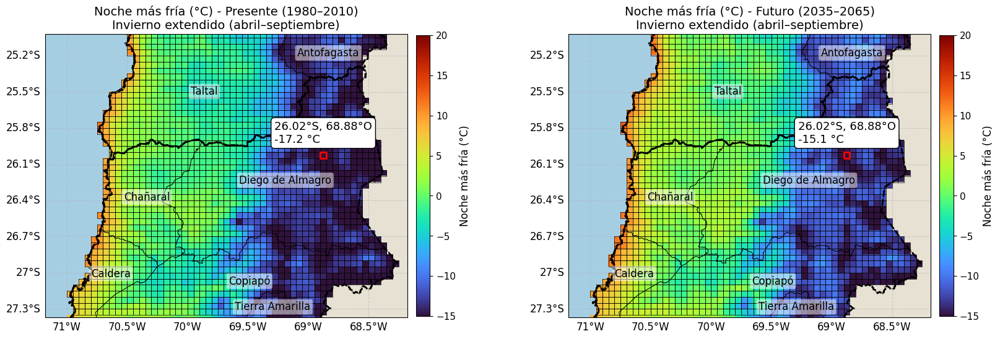

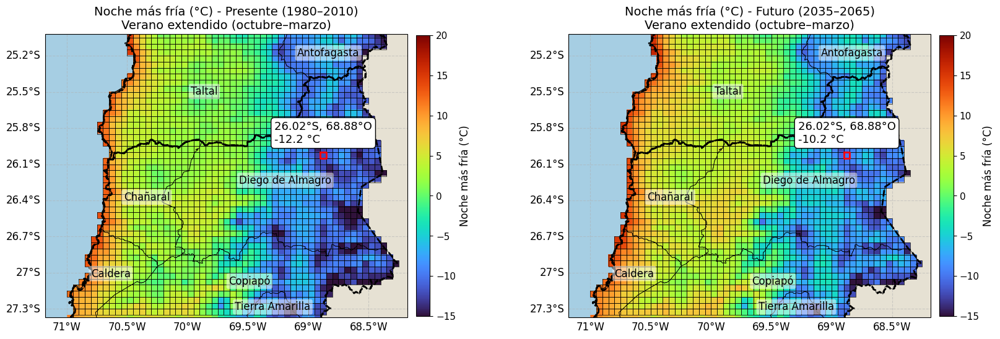

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='coldest_night')
plot_present_future(-26.02, -68.88, season='summer', variable='coldest_night')

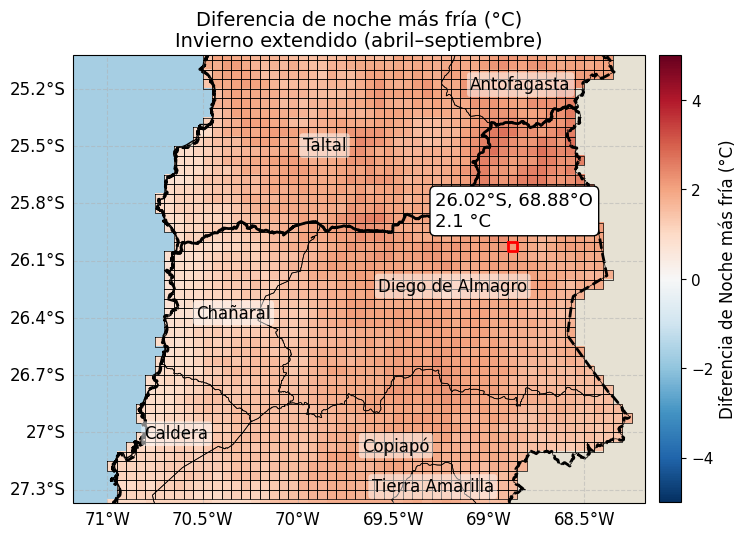

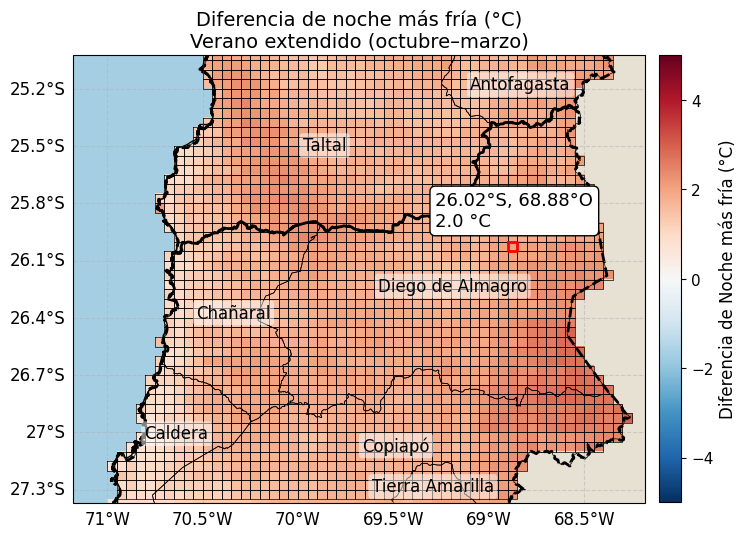

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='coldest_night')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='coldest_night')

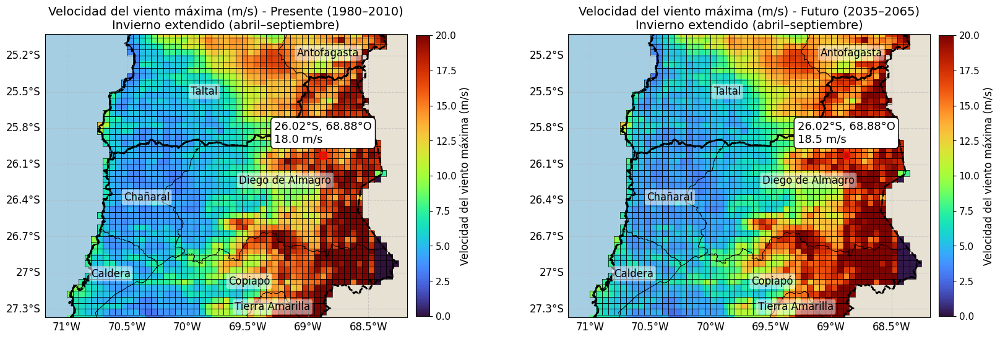

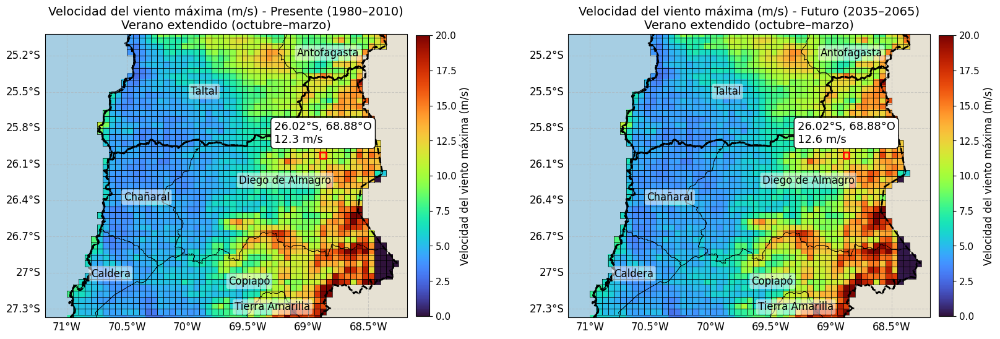

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='vel_max')
plot_present_future(-26.02, -68.88, season='summer', variable='vel_max')

<ipython-input-8-becb84e23569>:107: RuntimeWarning: divide by zero encountered in divide
  100 * (data_f - data_p) / data_p,


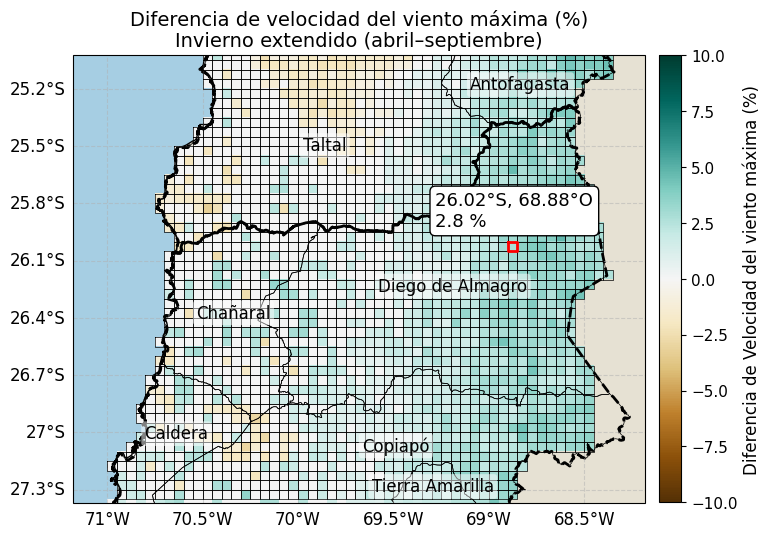

<ipython-input-8-becb84e23569>:107: RuntimeWarning: divide by zero encountered in divide
  100 * (data_f - data_p) / data_p,


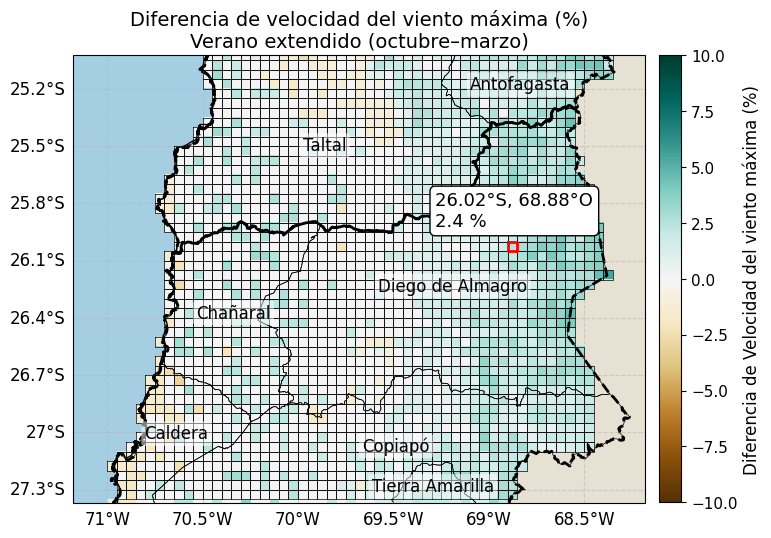

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='vel_max')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='vel_max')

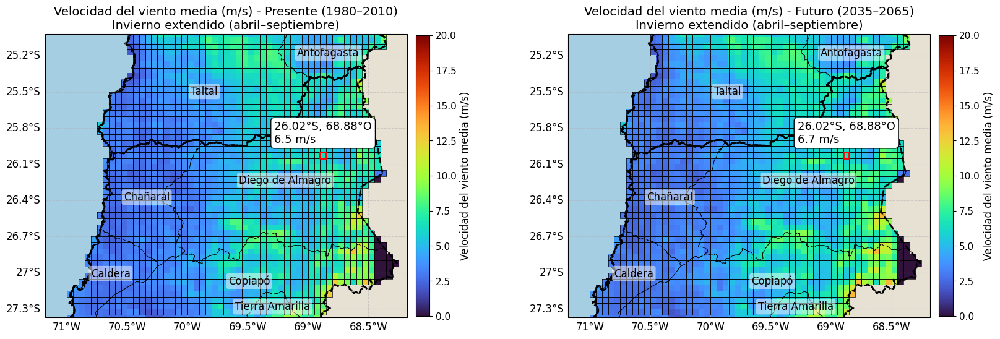

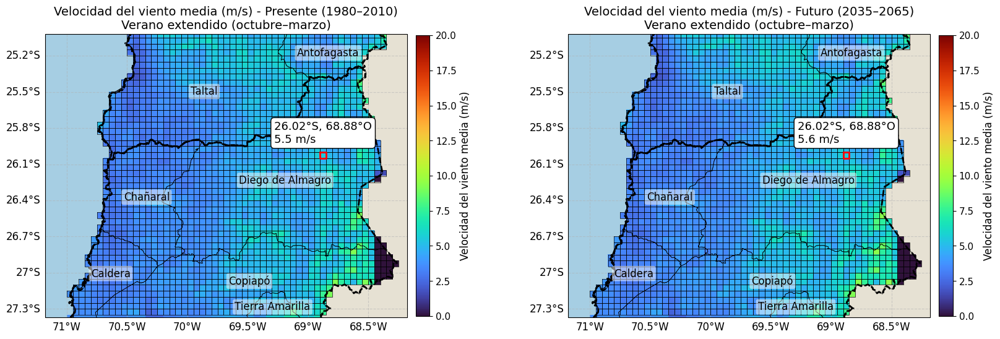

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='vel_mean')
plot_present_future(-26.02, -68.88, season='summer', variable='vel_mean')

<ipython-input-8-becb84e23569>:107: RuntimeWarning: invalid value encountered in divide
  100 * (data_f - data_p) / data_p,


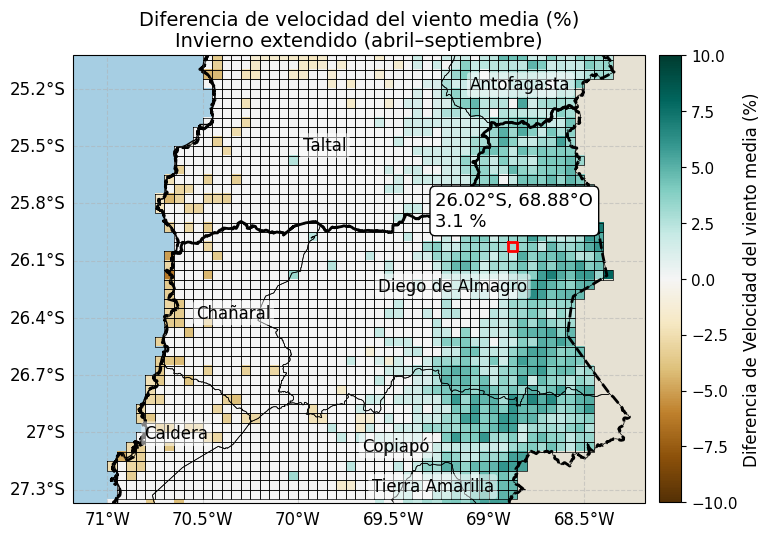

<ipython-input-8-becb84e23569>:107: RuntimeWarning: invalid value encountered in divide
  100 * (data_f - data_p) / data_p,


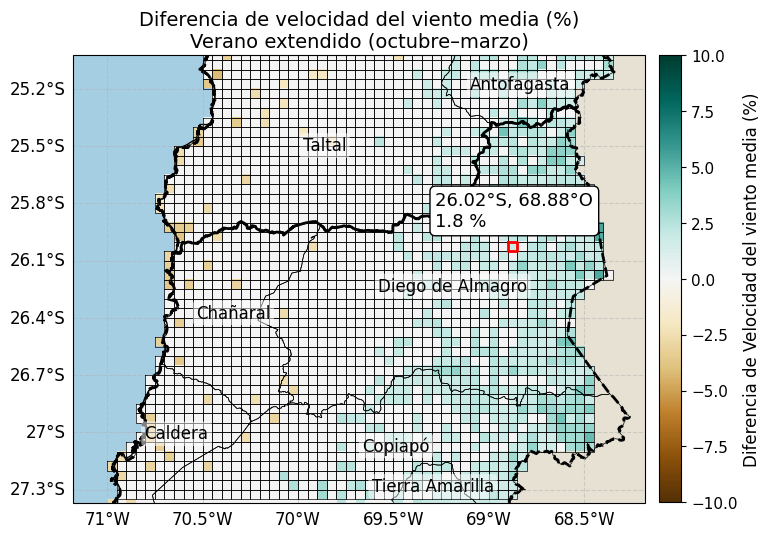

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='vel_mean')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='vel_mean')

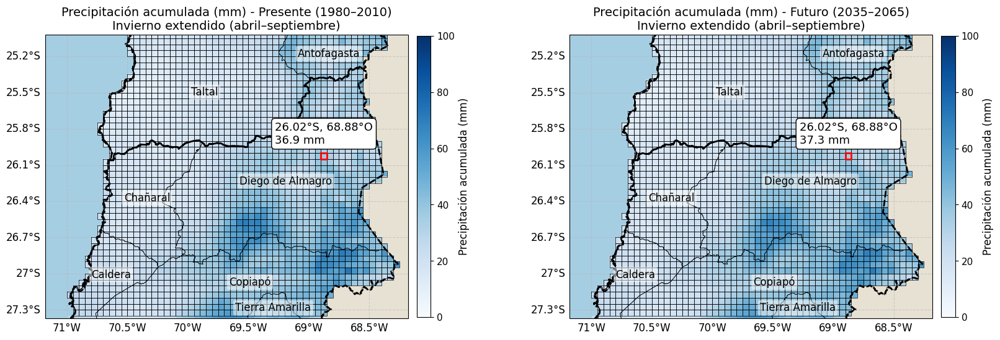

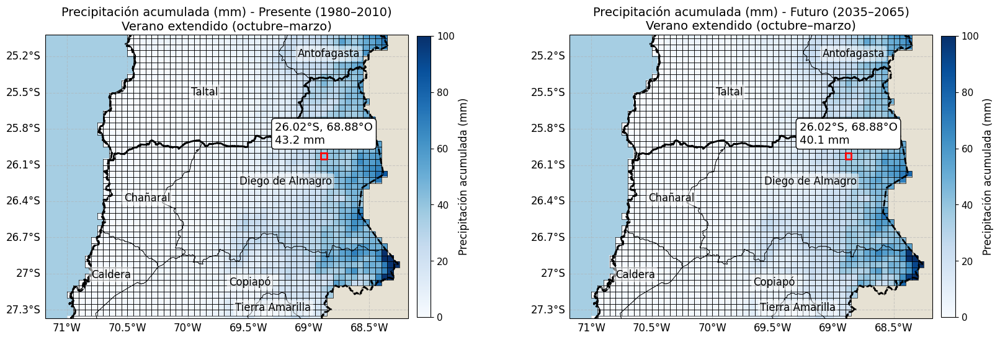

In [ ]:
plot_present_future(-26.02, -68.88, season='winter', variable='pr_sum')
plot_present_future(-26.02, -68.88, season='summer', variable='pr_sum')

<ipython-input-8-becb84e23569>:107: RuntimeWarning: divide by zero encountered in divide
  100 * (data_f - data_p) / data_p,


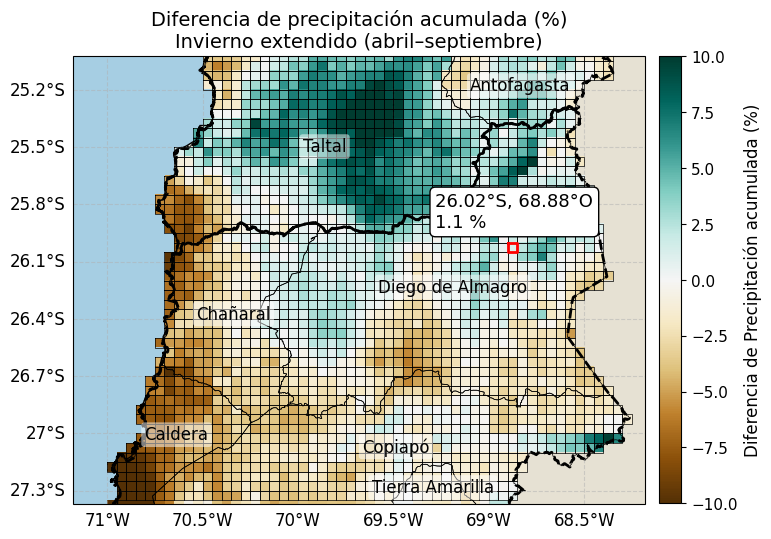

<ipython-input-8-becb84e23569>:107: RuntimeWarning: divide by zero encountered in divide
  100 * (data_f - data_p) / data_p,


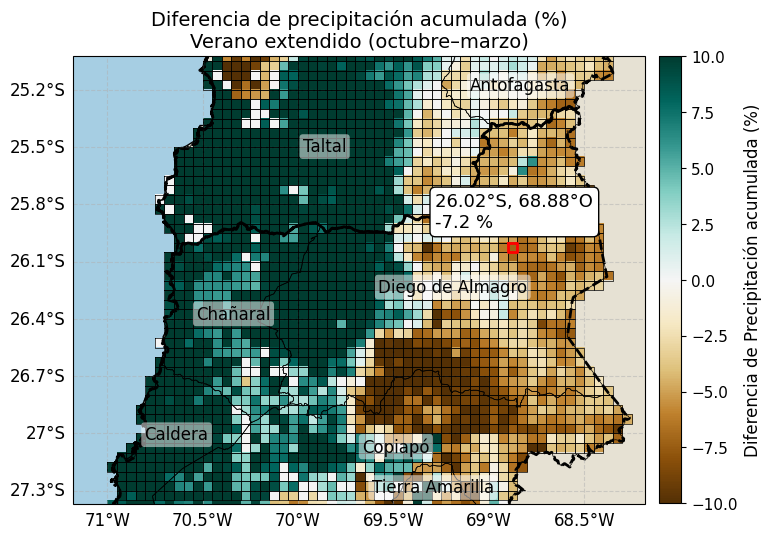

In [ ]:
plot_delta_present_future(-26.02, -68.88, season='winter', variable='pr_sum')
plot_delta_present_future(-26.02, -68.88, season='summer', variable='pr_sum')
